In [1]:
import numpy as np
import pandas as pd
import json
import os

import torch
import torch.utils.data
import cv2


from PIL import Image
import  matplotlib.pyplot as plt


import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader

from torchvision import transforms
import seaborn as sns
import albumentations as A

import math
import sys
import time
import torch
from pprint import pprint
import tqdm


In [2]:
!pip install -q mean_average_precision
from mean_average_precision import MetricBuilder


In [3]:
to_tensor = transforms.ToTensor()

def val_transform(img):
    img_tensor = to_tensor(img)
    return img_tensor.unsqueeze(0)

def visualize_prediction(file, model, device='cuda', verbose=True, thresh=0.5, n_colors=None, plot_img=True):
    img = Image.open(file)
    img_tensor = val_transform(img)
    img_tensor = img_tensor
    model.to(device)
    model.eval()
    with torch.no_grad():
        predictions = model(img_tensor.to(device)) # list of size 1
    prediction = predictions[0]
    
    if n_colors is None:
        n_colors = model.roi_heads.box_predictor.cls_score.out_features
    
    palette = sns.color_palette(None, n_colors)
    
    # visualize
    img = cv2.imread(file, cv2.COLOR_BGR2RGB)
    image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(prediction['boxes'])):
        x1, x2, x3, x4 = map(int, prediction['boxes'][i].tolist())
        label = int(prediction['labels'][i].cpu())
        score = float(prediction['scores'][i].cpu())
        color = palette[label]
        if verbose:
            if score > thresh:
                print ('Class: {}, Confidence: {}'.format("ball", score))
        if score > thresh:
            image = cv2.rectangle(image, (x1, x2), (x3, x4), np.array(color) * 255, 2)
            cv2.putText(image, "ball", (x1, x2-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
    if plot_img:
        show_image(image)
    return image, prediction

In [4]:
class DetectionDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict_file, transforms=None, add_path=None):
        self.transforms = transforms
        with open(data_dict_file, 'r') as f:
            self.data_dict = json.load(f)
        if add_path:
            self.data_dict = {add_path + i:j for i,j in self.data_dict.items()}

        self.imgs = list(self.data_dict.keys())

    def __getitem__(self, idx):
        # load images ad masks
        img_path = self.imgs[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.
        h, w = image.shape[:2]

        num_objs = len(self.data_dict[img_path])
        boxes = []
        for i in range(num_objs):
            bbox = self.data_dict[img_path][i]
            xmin = bbox[0] * w
            xmax = bbox[1] * w
            ymin = bbox[2] * h
            ymax = bbox[3] * h
            boxes.append([xmin, ymin, xmax, ymax])
        
        
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        annot = torch.ones(len(boxes)).long()  
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((boxes.shape[0]), dtype=torch.int64)
        targets = {}
        targets["iscrowd"] = iscrowd
        if self.transforms:
            sample = self.transforms(image = image,
                                     bboxes = boxes,
                                     category_ids = annot)
            targets['boxes'] = torch.Tensor(sample['bboxes'])
            targets['labels'] = torch.Tensor(sample['category_ids']).long()
            if len(targets['boxes']) == 0:
                targets['boxes'] = torch.zeros((0, 4), dtype=torch.float32)
                targets['labels'] = torch.zeros(1).long()
            image = torch.permute(torch.Tensor(sample['image']), (2, 0, 1))
        return image, targets

    def __len__(self):
        return len(self.imgs)

    def num_classes(self):
        return 1

def show_image(image, figsize=(10, 10)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.axis("off")
    plt.show()
    

In [9]:

transform_train = A.Compose([
    A.LongestMaxSize(620),
    A.SmallestMaxSize(520),
    A.RandomCrop(height=400, width=400),
    A.HorizontalFlip(p=0.5),
    A.MotionBlur(blur_limit=17, p=0.2),
    A.RandomBrightnessContrast(p=0.2),
    A.ShiftScaleRotate(p=0.2),
    A.RandomBrightnessContrast(p=0.3),
    
], bbox_params=A.BboxParams(format='pascal_voc', min_visibility = 0.3, label_fields=['category_ids'])
)

transform_val = A.Compose([
    A.LongestMaxSize(620),
    A.SmallestMaxSize(520),
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids'])
)

In [10]:
# collate_fn needs for batch
def collate_fn(batch):
    return tuple(zip(*batch))

In [11]:
train_dataset = DetectionDataset(
    data_dict_file="/kaggle/input/object-detections-balls/oi5_ball_filename_to_bbox_train.json", 
    transforms=transform_train,
    add_path = '/kaggle/input/object-detections-balls/')
train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=4,)
val_dataset = DetectionDataset(
    data_dict_file="/kaggle/input/object-detections-balls/oi5_ball_filename_to_bbox_val.json", 
    transforms=transform_val,
    add_path = '/kaggle/input/object-detections-balls/')
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=4,)

In [12]:
batch = next(iter(val_dataloader))

In [13]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
    pretrained=False,
    pretrained_backbone=False)
num_classes = 2
in_channels = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_channels = in_channels, num_classes = num_classes)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained_backbone' is deprecated since 0.13 and may be removed in the future, please use 'weights_backbone' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to 

In [14]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
for param in model.parameters():
    param.requires_grad = True
for param in model.roi_heads.box_predictor.parameters():
    param.requires_grad = True
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)
model.to(device);


In [15]:
from kaggle_secrets import UserSecretsClient
import wandb
user_secrets = UserSecretsClient()
wandb_key = user_secrets.get_secret("wandb")
wandb.login(key=wandb_key)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [16]:
run = wandb.init(
    project="object_detection_balls",
    notes = "without pretrain"
)

wandb: Currently logged in as: mishaya. Use `wandb login --relogin` to force relogin


In [17]:
def train_one_epoch(model, optimizer, data_loader, device, epoch):
    model.train()
    step = len(data_loader) * max(0, epoch - 1)
    for ind, (images, targets) in enumerate(tqdm.tqdm_notebook(data_loader)):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)
        losses = sum([value for value in loss_dict.values()])
        loss_value = losses.item()
        step += 1
        wandb.log({"epoch": epoch,
           "loss": loss_value,
           "step": step,
            }
        )
        if not math.isfinite(loss_value):
            print("Loss is {}, stopping training".format(loss_value))
            print(loss_dict_reduced)
            sys.exit(1)
        
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    print(loss_value)

def val_one_epoch(model, optimizer, data_loader, device, epoch, log=True):
    model.eval()
    step = 0
    # create metric_fn
    metric_fn = MetricBuilder.build_evaluation_metric("map_2d", async_mode=True, num_classes=1)
    with torch.no_grad():
        for ind, (images, targets) in enumerate(tqdm.tqdm_notebook(data_loader)):
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            predictions = model(images, targets)
            step += 1
            
            #calculate MAP
            ##GT
            lst_boxes_for_images = []
            for curr in targets:
                curr_gt = []
                for box, label in zip(curr['boxes'], curr['labels']):
                    curr_gt.append([box[0].item(),
                                     box[1].item(),
                                     box[2].item(),
                                     box[3].item(),
                                     0,
                                     0,
                                     0])
                lst_boxes_for_images.append(np.array(curr_gt))
            #preds
            ls_batch_preds = []
            for i in range(len(predictions)):
                predicts = []
                for box, label, score in zip(predictions[i]['boxes'],
                                             predictions[i]['labels'],
                                             predictions[i]['scores']):
                    predicts.append([box[0].item(),
                                     box[1].item(),
                                     box[2].item(),
                                     box[3].item(),
                                     0,
                                     score.item()])
                ls_batch_preds.append(np.array(predicts))
            #concat
            for i in range(len(lst_boxes_for_images)):
                metric_fn.add(ls_batch_preds[i], lst_boxes_for_images[i])

        VOC_PASCAL_mAP = metric_fn.value(iou_thresholds=0.5, recall_thresholds=np.arange(0., 1.1, 0.1))['mAP']
        VOC_PASCAL_mAP_in_all_points = metric_fn.value(iou_thresholds=0.5)['mAP']
        COCO_mAP = metric_fn.value(iou_thresholds=np.arange(0.5, 1.0, 0.05), recall_thresholds=np.arange(0., 1.01, 0.01), mpolicy='soft')['mAP']
        print(f"VOC PASCAL mAP: {VOC_PASCAL_mAP}")
        print(f"VOC PASCAL mAP in all points: {VOC_PASCAL_mAP_in_all_points}")
        print(f"COCO mAP: {COCO_mAP}")
        
        if log:
            wandb.log({"epoch": epoch,
               "step_val": step,
               "VOC_PASCAL_mAP": VOC_PASCAL_mAP,
               "VOC PASCAL mAP in all points": VOC_PASCAL_mAP_in_all_points,
               "COCO_mAP": COCO_mAP}
            )
        
        for i in range(10):
            try:
                image_id = "{:04}".format(i)
                file = f"/kaggle/input/object-detections-balls/oi5_ball/{image_id}.jpg"
                out = visualize_prediction(file, model, thresh=0.5, plot_img=False)[0]
                image = wandb.Image(out, caption=f"random field {i}", file_type="jpg")
                run.log({"images_logs": image})
            except Exception as e:
                print(i, e)


In [ ]:
num_epochs = 100
for epoch in tqdm.tqdm_notebook(range(1, num_epochs + 1)):
    train_one_epoch(model, optimizer, train_dataloader, device, epoch)
    val_one_epoch(model, optimizer, val_dataloader, device, epoch)

/tmp/ipykernel_34/1557297993.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for epoch in tqdm.tqdm_notebook(range(1, num_epochs + 1)):


  0%|          | 0/100 [00:00<?, ?it/s]

/tmp/ipykernel_34/2831919596.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ind, (images, targets) in enumerate(tqdm.tqdm_notebook(data_loader)):


  0%|          | 0/719 [00:00<?, ?it/s]

0.18795213103294373


/tmp/ipykernel_34/2831919596.py:32: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ind, (images, targets) in enumerate(tqdm.tqdm_notebook(data_loader)):


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.008166832849383354
VOC PASCAL mAP in all points: 0.0027781445533037186
COCO mAP: 0.0006840378628112376
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'


  0%|          | 0/719 [00:00<?, ?it/s]

0.13197344541549683


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.1051284670829773
VOC PASCAL mAP in all points: 0.045737374573946
COCO mAP: 0.014638322405517101
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'


  0%|          | 0/719 [00:00<?, ?it/s]

0.1593453586101532


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.12731121480464935
VOC PASCAL mAP in all points: 0.0774715319275856
COCO mAP: 0.031509753316640854
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'


  0%|          | 0/719 [00:00<?, ?it/s]

0.110951729118824


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.14480428397655487
VOC PASCAL mAP in all points: 0.09715937823057175
COCO mAP: 0.03758953884243965
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.5341074466705322


  0%|          | 0/719 [00:00<?, ?it/s]

0.08823392540216446


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.15379947423934937
VOC PASCAL mAP in all points: 0.10336998850107193
COCO mAP: 0.04768761247396469
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.6413466930389404


  0%|          | 0/719 [00:00<?, ?it/s]

0.1249968633055687


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.20789074897766113
VOC PASCAL mAP in all points: 0.17506687343120575
COCO mAP: 0.07820606976747513
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.5700257420539856


  0%|          | 0/719 [00:00<?, ?it/s]

0.1324925422668457


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.22097428143024445
VOC PASCAL mAP in all points: 0.19117988646030426
COCO mAP: 0.08791814744472504
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.5041227340698242


  0%|          | 0/719 [00:00<?, ?it/s]

0.16195781528949738


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.19847038388252258
VOC PASCAL mAP in all points: 0.18120847642421722
COCO mAP: 0.07612589001655579
Class: ball, Confidence: 0.6373677253723145
Class: ball, Confidence: 0.6116929650306702
Class: ball, Confidence: 0.509759247303009
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.7961306571960449
Class: ball, Confidence: 0.5030207633972168
Class: ball, Confidence: 0.5040415525436401


  0%|          | 0/719 [00:00<?, ?it/s]

0.10320688784122467


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.19114896655082703
VOC PASCAL mAP in all points: 0.15714293718338013
COCO mAP: 0.07335168868303299
Class: ball, Confidence: 0.6287882924079895
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.5746468305587769
Class: ball, Confidence: 0.7229652404785156


  0%|          | 0/719 [00:00<?, ?it/s]

0.12983429431915283


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.238401398062706
VOC PASCAL mAP in all points: 0.21102674305438995
COCO mAP: 0.09714905917644501
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.5721825957298279
Class: ball, Confidence: 0.6030067205429077
Class: ball, Confidence: 0.567818820476532
Class: ball, Confidence: 0.5111638903617859
Class: ball, Confidence: 0.7165364027023315
Class: ball, Confidence: 0.6659078598022461
Class: ball, Confidence: 0.6166016459465027


  0%|          | 0/719 [00:00<?, ?it/s]

0.12766802310943604


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.21044844388961792
VOC PASCAL mAP in all points: 0.17506422102451324
COCO mAP: 0.08352696150541306
Class: ball, Confidence: 0.584765613079071
Class: ball, Confidence: 0.5746693015098572
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.5517308115959167
Class: ball, Confidence: 0.6281735301017761
Class: ball, Confidence: 0.8091311454772949
Class: ball, Confidence: 0.7155565619468689
Class: ball, Confidence: 0.7066094279289246
Class: ball, Confidence: 0.651581346988678
Class: ball, Confidence: 0.8339371681213379
Class: ball, Confidence: 0.6270835995674133
Class: ball, Confidence: 0.7368685007095337


  0%|          | 0/719 [00:00<?, ?it/s]

0.09349480271339417


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.2539142966270447
VOC PASCAL mAP in all points: 0.21996119618415833
COCO mAP: 0.10964719951152802
Class: ball, Confidence: 0.8942616581916809
Class: ball, Confidence: 0.6019286513328552
Class: ball, Confidence: 0.597504198551178
Class: ball, Confidence: 0.5569223761558533
Class: ball, Confidence: 0.5402562022209167
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.645646333694458
Class: ball, Confidence: 0.5588997602462769
Class: ball, Confidence: 0.5417988896369934
Class: ball, Confidence: 0.6739954352378845
Class: ball, Confidence: 0.9486387968063354
Class: ball, Confidence: 0.5612138509750366


  0%|          | 0/719 [00:00<?, ?it/s]

0.10962093621492386


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.25607773661613464
VOC PASCAL mAP in all points: 0.240193709731102
COCO mAP: 0.1272769570350647
Class: ball, Confidence: 0.5692237019538879
Class: ball, Confidence: 0.5554815530776978
Class: ball, Confidence: 0.5290579199790955
Class: ball, Confidence: 0.5282108187675476
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.6731644868850708
Class: ball, Confidence: 0.5657037496566772
Class: ball, Confidence: 0.5346276164054871
Class: ball, Confidence: 0.8329108357429504
Class: ball, Confidence: 0.5091539025306702
Class: ball, Confidence: 0.649415135383606


  0%|          | 0/719 [00:00<?, ?it/s]

0.16125495731830597


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.2830314338207245
VOC PASCAL mAP in all points: 0.2657108008861542
COCO mAP: 0.13181617856025696
Class: ball, Confidence: 0.7512545585632324
Class: ball, Confidence: 0.6632209420204163
Class: ball, Confidence: 0.5390856266021729
Class: ball, Confidence: 0.5046727657318115
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.5701948404312134
Class: ball, Confidence: 0.5209835171699524
Class: ball, Confidence: 0.7300131916999817
Class: ball, Confidence: 0.8314149975776672
Class: ball, Confidence: 0.634696900844574
Class: ball, Confidence: 0.5091498494148254
Class: ball, Confidence: 0.5608468651771545


  0%|          | 0/719 [00:00<?, ?it/s]

0.16972360014915466


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.286007285118103
VOC PASCAL mAP in all points: 0.268934041261673
COCO mAP: 0.14124727249145508
Class: ball, Confidence: 0.6356404423713684
Class: ball, Confidence: 0.6097462177276611
Class: ball, Confidence: 0.5150911211967468
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.5611693263053894
Class: ball, Confidence: 0.8602465987205505
Class: ball, Confidence: 0.5958197116851807
Class: ball, Confidence: 0.5830097794532776
Class: ball, Confidence: 0.7301362752914429
Class: ball, Confidence: 0.6621472239494324
Class: ball, Confidence: 0.6410546898841858
Class: ball, Confidence: 0.6172422766685486
Class: ball, Confidence: 0.5267059206962585
Class: ball, Confidence: 0.8851284980773926
Class: ball, Confidence: 0.6855447888374329
Class: ball, Confidence: 0.6125358939170837
Class: ball, Confidence: 0.6122589111328125


  0%|          | 0/719 [00:00<?, ?it/s]

0.13779763877391815


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.29186931252479553
VOC PASCAL mAP in all points: 0.2582099735736847
COCO mAP: 0.1389131098985672
Class: ball, Confidence: 0.6010075211524963
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.7301387786865234
Class: ball, Confidence: 0.7749865651130676
Class: ball, Confidence: 0.5333983898162842
Class: ball, Confidence: 0.8456447124481201
Class: ball, Confidence: 0.5181216597557068
Class: ball, Confidence: 0.6422078609466553
Class: ball, Confidence: 0.7952815890312195


  0%|          | 0/719 [00:00<?, ?it/s]

0.10376404970884323


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.3311605155467987
VOC PASCAL mAP in all points: 0.32103750109672546
COCO mAP: 0.16341190040111542
Class: ball, Confidence: 0.7532347440719604
Class: ball, Confidence: 0.6474751830101013
Class: ball, Confidence: 0.6280257701873779
Class: ball, Confidence: 0.6198033094406128
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.6745466589927673
Class: ball, Confidence: 0.5666648149490356
Class: ball, Confidence: 0.7689962387084961
Class: ball, Confidence: 0.5784503221511841
Class: ball, Confidence: 0.8271599411964417
Class: ball, Confidence: 0.8450049161911011


  0%|          | 0/719 [00:00<?, ?it/s]

0.14668770134449005


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.32407230138778687
VOC PASCAL mAP in all points: 0.31374990940093994
COCO mAP: 0.16612417995929718
Class: ball, Confidence: 0.7965088486671448
Class: ball, Confidence: 0.6258560419082642
Class: ball, Confidence: 0.5033401846885681
Class: ball, Confidence: 0.500079870223999
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.7805805206298828
Class: ball, Confidence: 0.5630905628204346
Class: ball, Confidence: 0.8327165246009827
Class: ball, Confidence: 0.5978506207466125
Class: ball, Confidence: 0.6060577630996704
Class: ball, Confidence: 0.8783708810806274
Class: ball, Confidence: 0.6814651489257812
Class: ball, Confidence: 0.5181171298027039
Class: ball, Confidence: 0.501937747001648
Class: ball, Confidence: 0.8991515040397644


  0%|          | 0/719 [00:00<?, ?it/s]

0.17905941605567932


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.33013930916786194
VOC PASCAL mAP in all points: 0.30664435029029846
COCO mAP: 0.16427038609981537
Class: ball, Confidence: 0.7381448745727539
Class: ball, Confidence: 0.7246652841567993
Class: ball, Confidence: 0.7119468450546265
Class: ball, Confidence: 0.7102758884429932
Class: ball, Confidence: 0.625705897808075
Class: ball, Confidence: 0.5072782039642334
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.7277081608772278
Class: ball, Confidence: 0.7111620903015137
Class: ball, Confidence: 0.5623245239257812
Class: ball, Confidence: 0.8325605392456055
Class: ball, Confidence: 0.5901430249214172
Class: ball, Confidence: 0.5728635191917419
Class: ball, Confidence: 0.6226535439491272
Class: ball, Confidence: 0.5784682631492615
Class: ball, Confidence: 0.8744341135025024
Class: ball, Confidence: 0.6526834964752197
Class: ball, Confidence: 0.5970707535743713
Class: ball, Confidence: 0.8175641298294

  0%|          | 0/719 [00:00<?, ?it/s]

0.16199809312820435


  0%|          | 0/57 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/mean_average_precision/mean_average_precision_2d.py:64: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.match_table[c] = pd.concat([self.match_table[c], match_table], axis=0, join='outer')


VOC PASCAL mAP: 0.37013140320777893
VOC PASCAL mAP in all points: 0.35341307520866394
COCO mAP: 0.18877467513084412
Class: ball, Confidence: 0.7997400760650635
Class: ball, Confidence: 0.7745361924171448
Class: ball, Confidence: 0.5816519856452942
2 [Errno 2] No such file or directory: '/kaggle/input/object-detections-balls/oi5_ball/0002.jpg'
Class: ball, Confidence: 0.5252018570899963
Class: ball, Confidence: 0.7650505304336548
Class: ball, Confidence: 0.6346099972724915
Class: ball, Confidence: 0.8646976351737976
Class: ball, Confidence: 0.5069607496261597
Class: ball, Confidence: 0.8463547825813293
Class: ball, Confidence: 0.835677444934845
Class: ball, Confidence: 0.7929835915565491
Class: ball, Confidence: 0.6150084137916565
Class: ball, Confidence: 0.9532355070114136


  0%|          | 0/719 [00:00<?, ?it/s]

Class: ball, Confidence: 0.9527882933616638


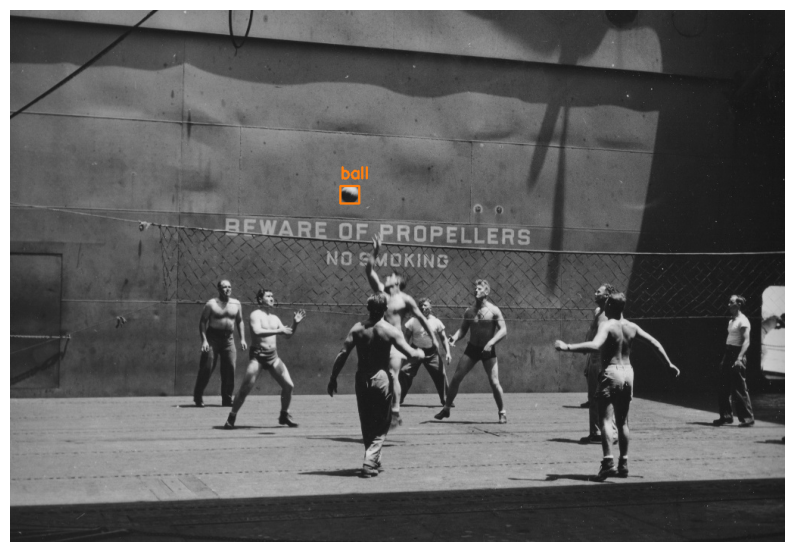

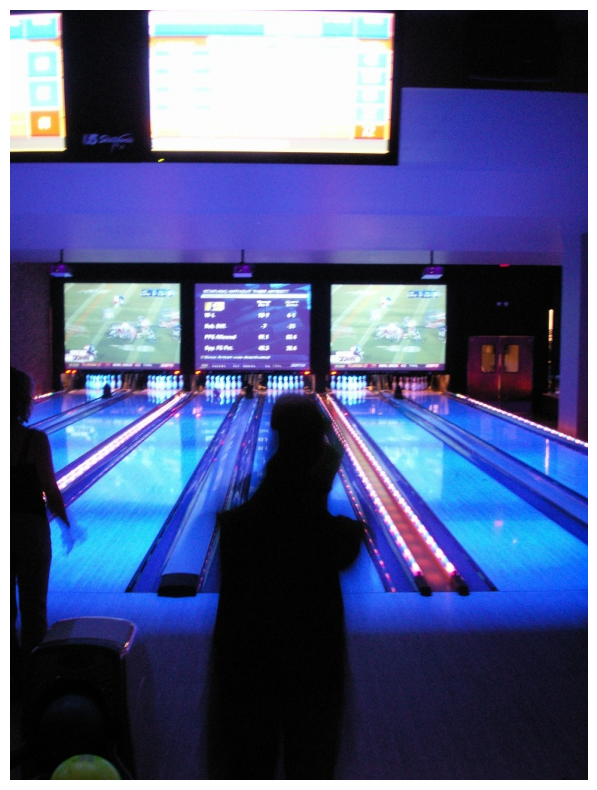

Class: ball, Confidence: 0.8768330812454224


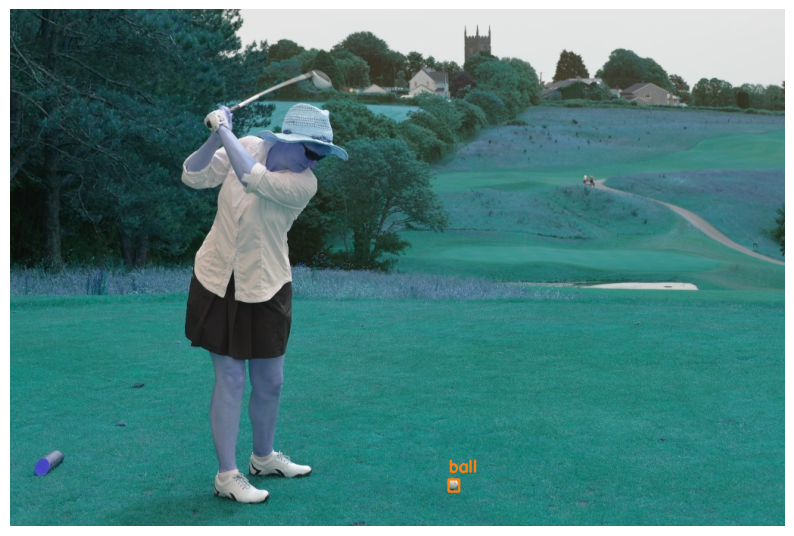

Class: ball, Confidence: 0.9171158075332642


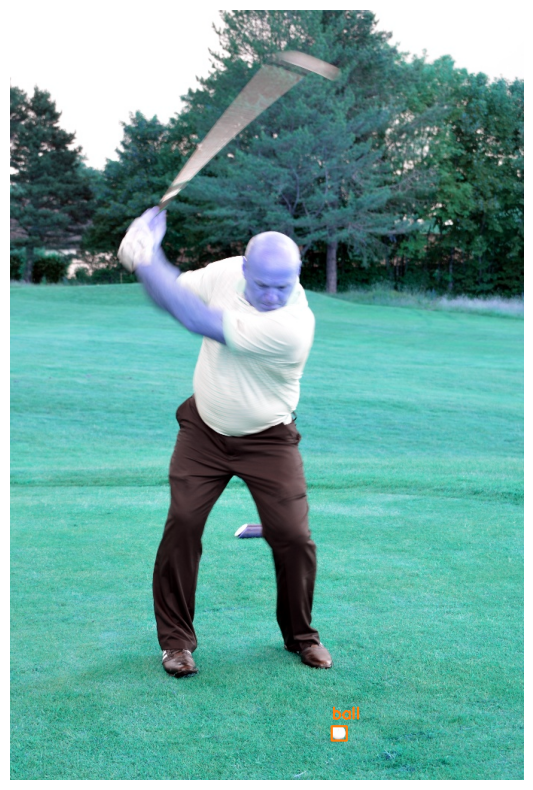

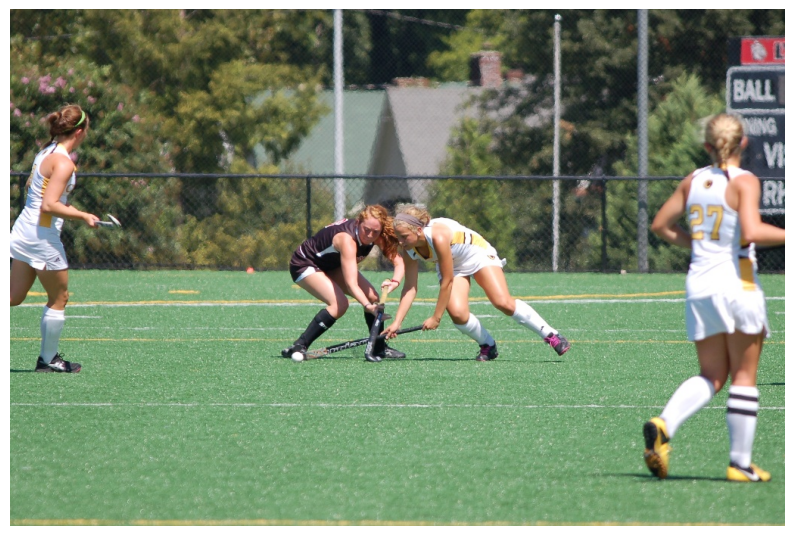

Class: ball, Confidence: 0.919352114200592


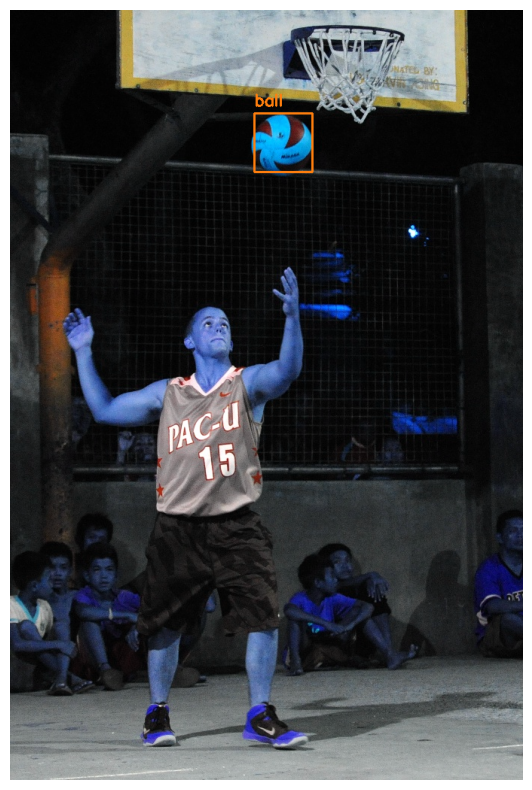

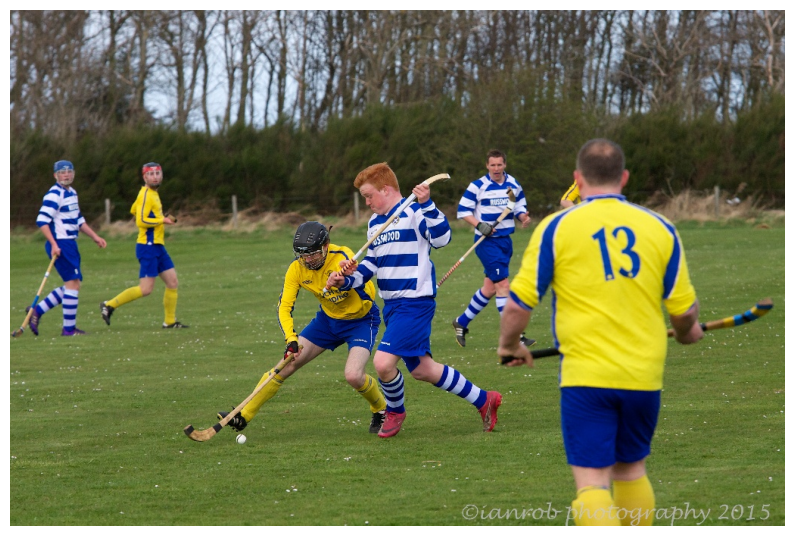

Class: ball, Confidence: 0.9542731642723083


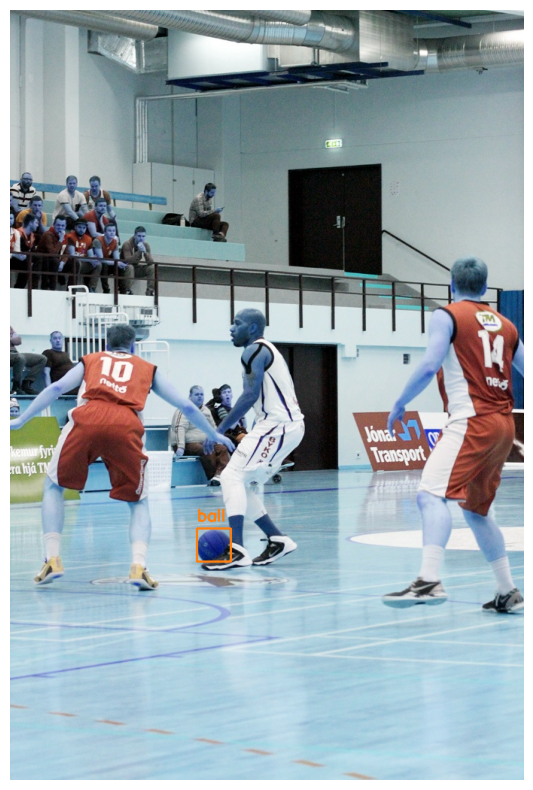

Class: ball, Confidence: 0.9949243068695068


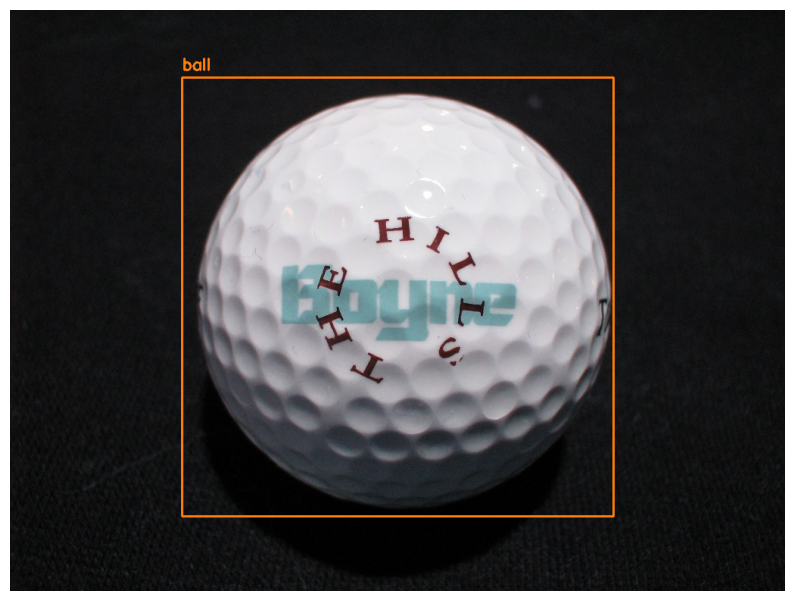

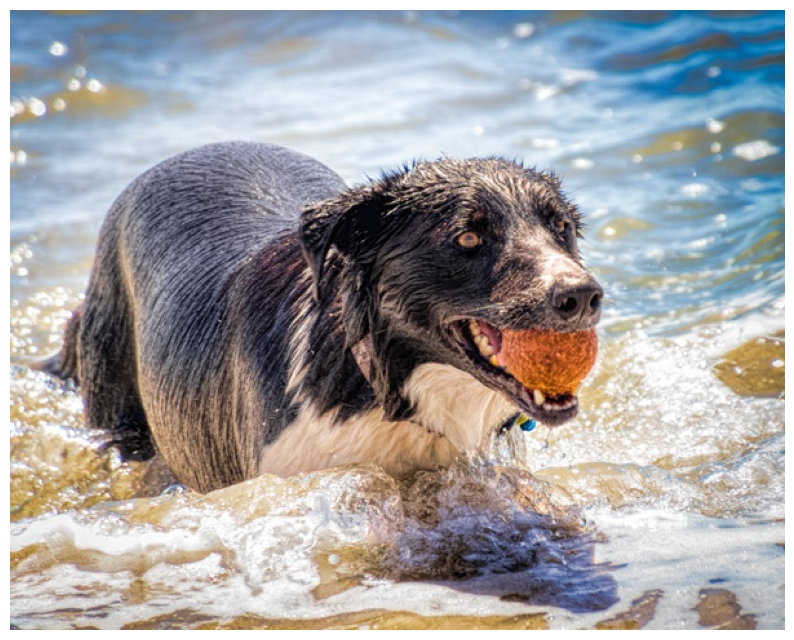

Class: ball, Confidence: 0.9546183943748474


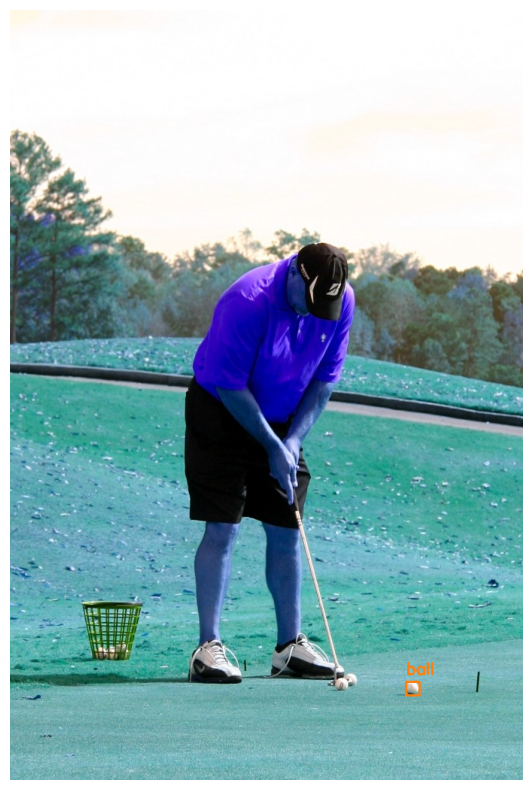

Class: ball, Confidence: 0.959952712059021
Class: ball, Confidence: 0.9150310158729553


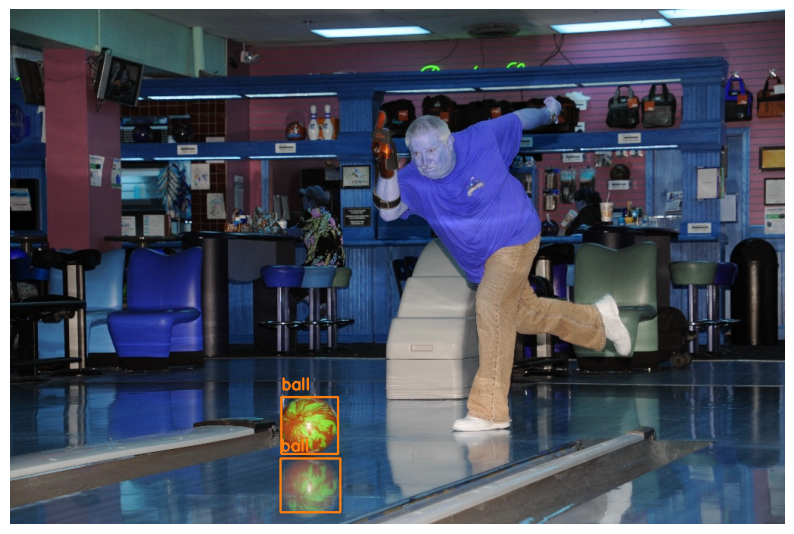

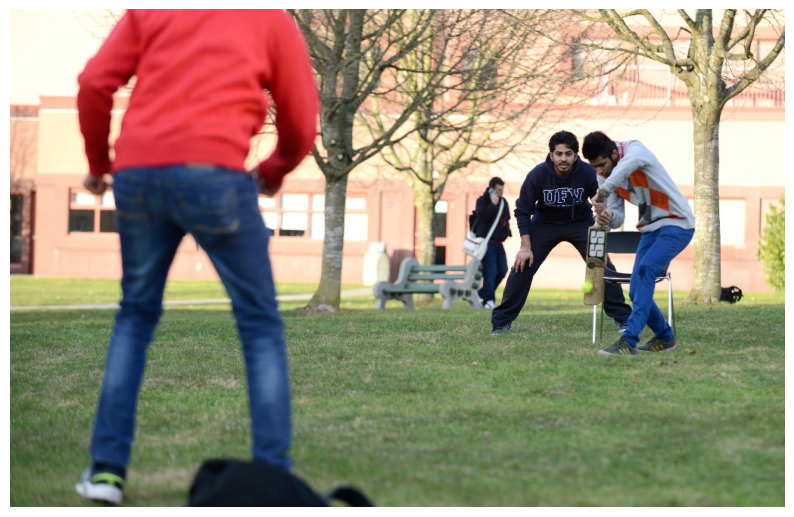

Class: ball, Confidence: 0.9869667291641235
Class: ball, Confidence: 0.9710609316825867
Class: ball, Confidence: 0.9576433300971985
Class: ball, Confidence: 0.9408631920814514
Class: ball, Confidence: 0.9208316802978516
Class: ball, Confidence: 0.9190268516540527
Class: ball, Confidence: 0.9140620827674866
Class: ball, Confidence: 0.8779260516166687
Class: ball, Confidence: 0.8607126474380493
Class: ball, Confidence: 0.8315120339393616
Class: ball, Confidence: 0.8092098832130432


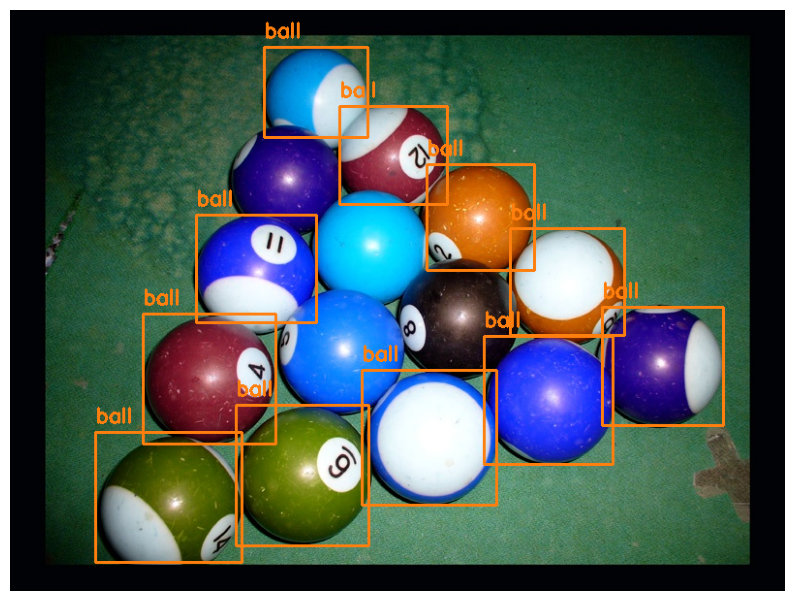

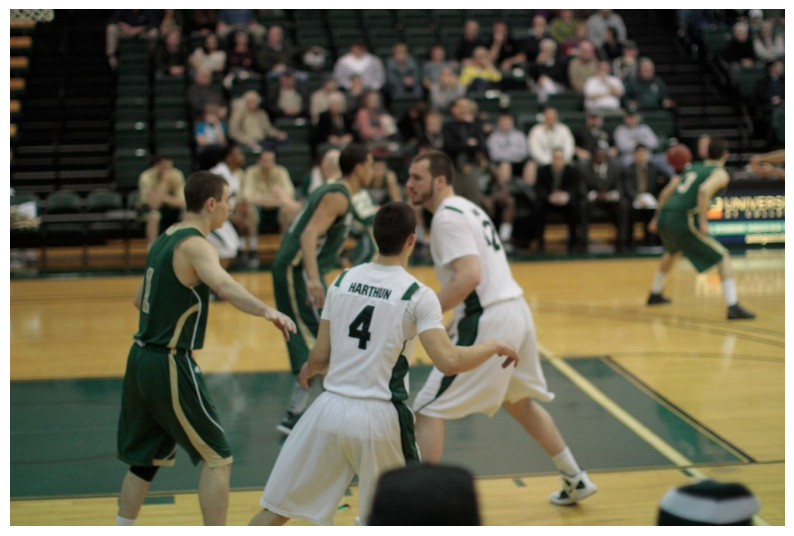

Class: ball, Confidence: 0.884233295917511


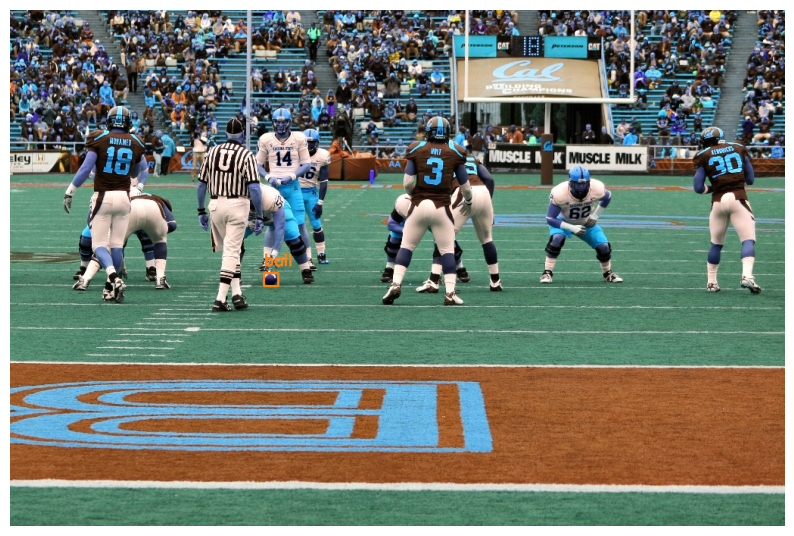

Class: ball, Confidence: 0.9404974579811096


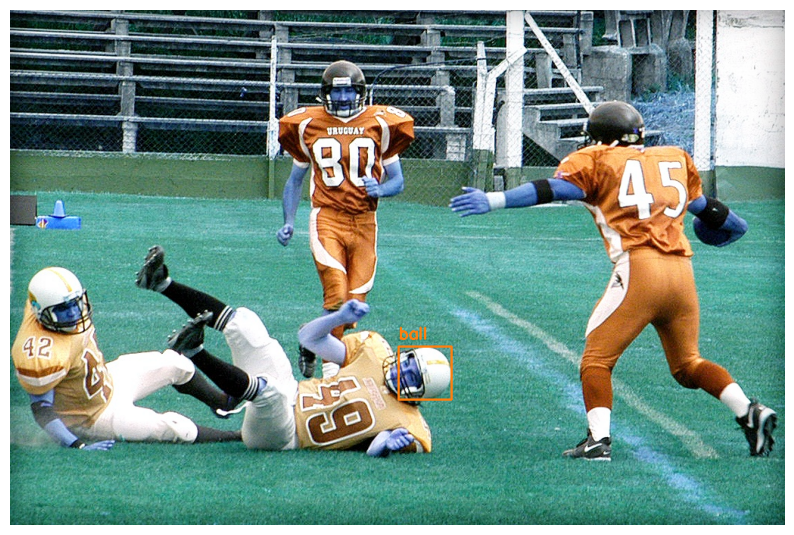

Class: ball, Confidence: 0.9715767502784729
Class: ball, Confidence: 0.858253538608551


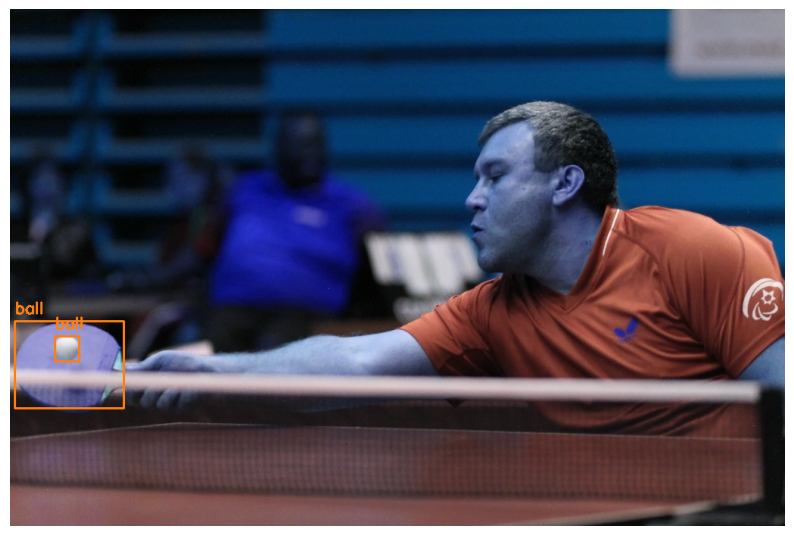

Class: ball, Confidence: 0.997191846370697
Class: ball, Confidence: 0.9969438910484314
Class: ball, Confidence: 0.9965387582778931


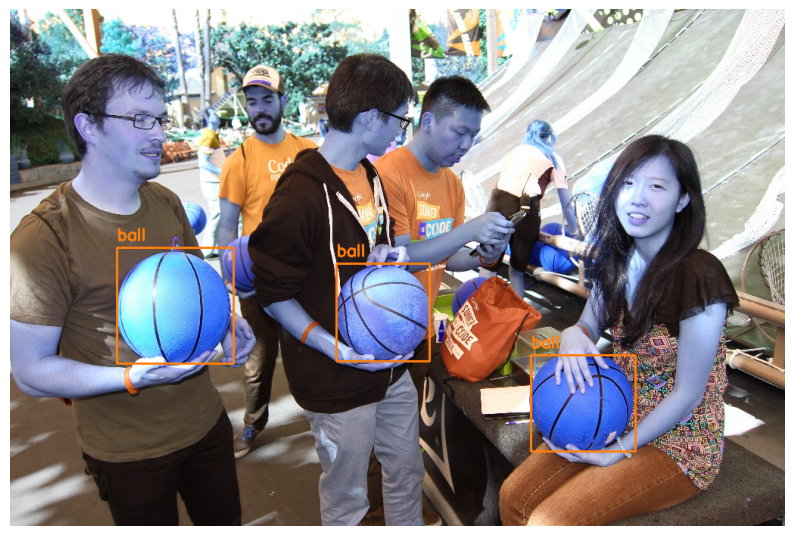

In [15]:
#качество запуска train_from_zero
for i in range(20):
    try:
        image_id = "{:04}".format(i)
        file = f"/kaggle/input/object-detections-balls/oi5_ball/{image_id}.jpg"
        img = Image.open(file)
        out = visualize_prediction(file, model, thresh=0.8)
    except:
        pass

# Вывод

Для обучения была выбрана модель [Fasterrcnn_resnet_50](https://pytorch.org/vision/main/models/generated/torchvision.models.detection.fasterrcnn_resnet50_fpn.html)

При запуске обучения с нуля (train_from_zero), модель была инициализирована случайными весами (pretrained=False, pretrained_backbone=False). Это привело к тому, что для достижения приемлемого качества требуется значительно больше шагов. За 50 эпох модель достигла качества coco_mAP=0.32 VS предобученная модлеь достигла качества map=0.5 за 10 эпох. Стоит отметить, что метрика продолжает расти, поэтому возможно продолжение обучения для дополнительного улучшения.



Запуск обучения strong_augment использовал следующую аугментацию
```
    A.LongestMaxSize(620),
    A.SmallestMaxSize(520),
    A.RandomCrop(height=400, width=400),
    A.HorizontalFlip(p=0.5),
    A.MotionBlur(blur_limit=17, p=0.2),
    A.RandomBrightnessContrast(p=0.2),
    A.ShiftScaleRotate(p=0.2),
    A.RandomBrightnessContrast(p=0.3),
```

Запуск обучения light_augment использовал следующую аугментацию
```
    A.LongestMaxSize(620),
    A.SmallestMaxSize(520),
    A.RandomCrop(height=400, width=400),
```

wandb logs: https://wandb.ai/mishaya/object_detection_balls?workspace=user-mishaya

Общее качество модели на конкретных примерах можно оценить, просматривая логи в wandb. При лучшем запуске метрика coco_mAP на валидации составила 0.505.
Так же стоит отметить что использовании аугментации слабо повлияло на улучшения качества модлеи, прирост составил (0.014 mAP).

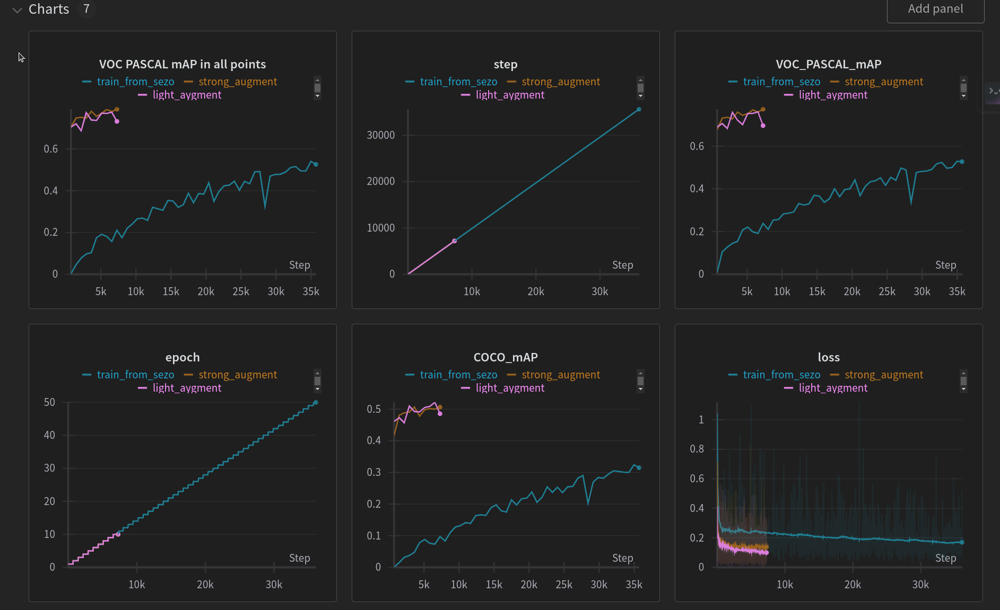